In [15]:
from mtgsdk import Card
from mtgsdk import Set
from mtgsdk import Type
from mtgsdk import Supertype
from mtgsdk import Subtype
from mtgsdk import Changelog
import os
import nltk
import regex as re
from nltk.tokenize import word_tokenize
import pickle
import math
from scipy import spatial
import numpy as np
import requests
import json
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from scipy import spatial
import sklearn 
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
import networkx as nx
from sklearn.decomposition import PCA
import traceback
from scipy.sparse import csr_matrix

In [16]:
all_data = json.load(open('cards_object.json'))

In [17]:
dict_flavor = {}
dict_text = {}
count = 0
stop_words = set(stopwords.words('english'))
stemmer = WordNetLemmatizer()
tokenizer = RegexpTokenizer(r'\w+')

for count,key in enumerate(all_data):
    tokenized = tokenizer.tokenize(all_data[key]['type'])
    for each in tokenized:
        if(each != "—"):
            flavor_list = all_data[key]['flavor']
            text_list = all_data[key]['text']
            if(flavor_list == None):
                flavor_list = ' '
            if(text_list == None):
                text_list = ' '
            flavor_list = tokenizer.tokenize(flavor_list)
            text_list = tokenizer.tokenize(text_list)
            flavor_list = [w for w in flavor_list if not w.lower() in stop_words]
            text_list = [w for w in text_list if not w.lower() in stop_words]
            flavor_list = [stemmer.lemmatize(word) for word in flavor_list]
            text_list = [stemmer.lemmatize(word) for word in text_list]
            print(flavor_list)
            print(text_list)
            try:
                if(flavor_list!= []):
                    dict_flavor[each].append(flavor_list)
            except:
                if(flavor_list!= []):
                    dict_flavor[each] = []
                    dict_flavor[each].append(flavor_list)
            try:
                if(text_list != []):
                    dict_text[each].append(text_list)
            except:
                if(text_list != []):
                    dict_text[each] = []
                    dict_text[each].append(text_list)                    

    
    

['hand', 'done']
['First', 'strike', 'creature', 'deal', 'combat', 'damage', 'creature', 'without', 'first', 'strike', 'Ancestor', 'Chosen', 'enters', 'battlefield', 'gain', '1', 'life', 'card', 'graveyard']
['hand', 'done']
['First', 'strike', 'creature', 'deal', 'combat', 'damage', 'creature', 'without', 'first', 'strike', 'Ancestor', 'Chosen', 'enters', 'battlefield', 'gain', '1', 'life', 'card', 'graveyard']
['hand', 'done']
['First', 'strike', 'creature', 'deal', 'combat', 'damage', 'creature', 'without', 'first', 'strike', 'Ancestor', 'Chosen', 'enters', 'battlefield', 'gain', '1', 'life', 'card', 'graveyard']
[]
['Flying', 'Angel', 'Mercy', 'enters', 'battlefield', 'gain', '3', 'life']
[]
['Flying', 'Angel', 'Mercy', 'enters', 'battlefield', 'gain', '3', 'life']
['warrior', 'admit', 'mortal', 'weakness', 'bolstered', 'immortal', 'strength']
['Target', 'creature', 'get', '3', '3', 'gain', 'flying', 'end', 'turn', 'blocked', 'except', 'creature', 'flying', 'reach']
['young', 'old'

In [18]:
list_of_common_expressions = []
window = 2
key_amount = {}
word_amount = {}
type_amount = {}
#Biword list
for key in all_data:
    try:
        text_list= tokenizer.tokenize(all_data[key]['text'])
        text_list = [w for w in text_list if not w.lower() in stop_words]
        text_list = [stemmer.lemmatize(word) for word in text_list]
        for i, word in enumerate(text_list):
            for w in range(window):
                if(i + 1 + w < len(text_list)):
                    try: 
                        key_amount[word + " " + text_list[(i + 1 + w)]] += 1
                    except:
                        key_amount[word + " " + text_list[(i + 1 + w)]] = 1
            try: 
                word_amount[word] += 1
            except:
                word_amount[word] = 1
                    # Getting the context that is behind by *window* words    
                #if i - w - 1 >= 0:
                   # try:
                     #   key_amount[word + " " + text_list[(i - 1 - w)]] += 1
                    #except: 
                        #key_amount[word + " " + text_list[(i - 1 - w)]] = 1
    except:
        pass

sorted_x = sorted(key_amount.items(), reverse = True, key=lambda kv: kv[1])
sorted_word = sorted(word_amount.items(), reverse = True, key=lambda kv: kv[1])


for key in dict_text:
    count = 0
    for each in dict_text[key]:
        count = count + 1
    type_amount[key] = count

sorted_type =  sorted(type_amount.items(), reverse = True, key=lambda kv: kv[1])
print(sorted_type)
print(len(sorted_x))
placement = {}
placement_word = {}
placement_type = {}
for count, key in enumerate(sorted_x):
    if(count<200):
        print(sorted_x[count])
    placement[sorted_x[count][0]] = count

for count, key in enumerate(sorted_type):
    if(count<200):
        print(sorted_x[count])
    placement_type[sorted_type[count][0]] = count
print(len(sorted_word))
for count, key in enumerate(sorted_word):
    if(count<200):
        print(sorted_word[count])
    placement_word[sorted_word[count][0]] = count

print(placement_type)
print("look")
print(word_amount["Vigilance"])

[('Creature', 12432), ('Instant', 2886), ('Enchantment', 2847), ('Human', 2758), ('Sorcery', 2704), ('Artifact', 2443), ('Legendary', 1845), ('Aura', 1081), ('Wizard', 886), ('Land', 855), ('Warrior', 841), ('Soldier', 729), ('Spirit', 580), ('Zombie', 530), ('Elemental', 504), ('Cleric', 502), ('Elf', 483), ('Shaman', 443), ('Beast', 428), ('Goblin', 405), ('Equipment', 381), ('Rogue', 375), ('Knight', 334), ('Bird', 333), ('Vampire', 331), ('Planeswalker', 269), ('Dragon', 268), ('Druid', 249), ('Horror', 243), ('Merfolk', 241), ('Cat', 236), ('Phyrexian', 224), ('Angel', 219), ('Insect', 188), ('Giant', 182), ('Construct', 166), ('Scout', 151), ('Artificer', 146), ('Demon', 143), ('Eldrazi', 142), ('Wall', 139), ('Golem', 123), ('Shapeshifter', 120), ('Pirate', 115), ('Dinosaur', 115), ('Berserker', 110), ('Snow', 110), ('Ogre', 109), ('Sliver', 109), ('Vanguard', 107), ('Snake', 104), ('Dog', 104), ('Faerie', 97), ('Monk', 95), ('Dwarf', 95), ('Arcane', 94), ('Drake', 93), ('Ally',

In [19]:
key_card_name = {}
np.zeros(len(sorted_x))

threshold1 = 1
threshold2 = 1
threshold3 = 1000
scaling_text = math.log(len(placement_word)) * 1.0
scaling_colors = 1.0
scaling_type = math.log(len(placement_type)) * 1


size1 = len(sorted_x)
size2 = len(sorted_word)
size3 = 9
size4 = len(placement_type)

for key in all_data:
    list_relevant = np.zeros(size1, dtype = np.float32)
    list_relevant_2 = np.zeros(size2, dtype = np.float32)
    colors = np.zeros(size3, dtype = np.float32)
    list_relevant_types = np.zeros(size4, dtype = np.float32)
    list_all_data = np.zeros(size1+size2+size3+size4, dtype = np.float32)
    #There's an error here
    try:
        text_list= tokenizer.tokenize(all_data[key]['text'])
        text_list = [w for w in text_list if not w.lower() in stop_words]
        text_list = [stemmer.lemmatize(word) for word in text_list]
        for i, word in enumerate(text_list):
            for w in range(window):
                if(i + 1 + w < len(text_list)):
                    if(key_amount[word + " " + text_list[(i + 1 + w)]]> threshold1):
                        relevant_value = np.float32((1/math.log(key_amount[word + " " + text_list[(i + 1 + w)]]) * scaling_text))
                        list_relevant[placement[word + " " + text_list[(i + 1 + w)]]] += relevant_value
                        list_all_data[placement[word + " " + text_list[(i + 1 + w)]]] += relevant_value
            if(word_amount[word] > threshold2) and word_amount[word]<threshold3:
                relevant_value = np.float32(1/math.log(word_amount[word]) * scaling_text)
                list_relevant_2[placement_word[word]] += relevant_value
                list_all_data[placement_word[word]+size1-1] += relevant_value
                    # Getting the context that is behind by *window* words    
                #if i - w - 1 >= 0:
                   # try:
                     #   key_amount[word + " " + text_list[(i - 1 - w)]] += 1
                    #except: 
                        #key_amount[word + " " + text_list[(i - 1 - w)]] = 1
        #key_card_name[all_data[key]['name']] = [list_relevant,list_relevant_2]
    except:
        #if(all_data[key]['name'] == "Trench Wurm"):        
            #print("This is Trench Wurm")
            #print(tokenizer.tokenize(all_data[key]['text']))
        #print(traceback.format_exc())
        pass
    
    multi = 0.0
    
    try:
        for each in all_data[key]['colors']:
            relevant_value = np.float32(1.0*scaling_colors)
            if each == 'White':
                colors[1] = 1.0 *scaling_colors
                list_all_data[size1+size2] = relevant_value
                multi += 1 
            if each == 'Blue':
                colors[2] = 1.0 *scaling_colors
                list_all_data[size1+size2+1] = relevant_value
                multi += 1
            if each == 'Black':
                colors[3] = 1.0 *scaling_colors
                list_all_data[size1+size2+2] = relevant_value
                multi += 1
            if each == 'Green':
                colors[4] = 1.0 *scaling_colors
                list_all_data[size1+size2+3] = relevant_value
                multi += 1
            if each == 'Red':
                colors[5] = 1.0 *scaling_colors
                list_all_data[size1+size2+4] = relevant_value
                multi += 1 
        
        if(multi) > 2:
            colors[8] = (multi-1)*scaling_colors
            list_all_data[size1+size2+7] = relevant_value
        elif(multi>1):
            colors[7] = 1.0* scaling_colors
            list_all_data[size1+size2+6] = relevant_value
        else:
            colors[6] = 1.0 *scaling_colors
            list_all_data[size1+size2+5] = relevant_value
    except:
        colors[0] = 1.0 * scaling_colors
        list_all_data[size1+size2-1] = relevant_value
    
    try:
        tokenized = tokenizer.tokenize(all_data[key]['type'])
        for each in tokenized:
            if(each != "—"):
                list_relevant_types[placement_type[each]] += 1/math.log(type_amount[each]) * scaling_type
                list_all_data[placement_type[each]+size1+size2+8] += 1/math.log(type_amount[each]) * scaling_type
    except:
        pass
    lists = [colors,list_relevant_types,list_relevant,list_relevant_2]
    key_card_name[all_data[key]['name']] = [colors,list_relevant_types,list_relevant,list_relevant_2,list_all_data]




joined = np.array     
#for name in key_card_name:
    #joined = np.concatenate((joined,key_card_name[name][1]), axis = 0)
    

#Sort this into clusters and set 1 axis to be the card name    
list = key_card_name['Serra Angel']
print(list[4])
    

[0. 0. 0. ... 0. 0. 0.]


In [20]:
from sklearn.decomposition import PCA


#for name in key_card_name:
    #joined = np.concatenate((joined,key_card_name[name][1]), axis = 0)
    

#Sort this into clusters and set 1 axis to be the card name    
list = key_card_name['Serra Angel']

Vectors_Colors = np.zeros([len(key_card_name.keys()),9])
Vectors_Types = np.zeros([len(key_card_name.keys()),size4])
Vectors_BiWords = np.zeros([len(key_card_name.keys()),size1])
Vectors_Words = np.zeros([len(key_card_name.keys()),size2])
Vector_All = np.zeros([len(key_card_name.keys()),size1+size2+size3+size4])
print(Vectors_Colors)
annotations = []

from random import sample

random_list = sample(range(len(key_card_name.keys())),1000)

print(random_list)

for count,name in enumerate(key_card_name):
    if(count in random_list):
        annotations.append(name)
        Vectors_Colors[count,:] = key_card_name[name][0]
        Vectors_Types[count,:] = key_card_name[name][1]
        Vectors_BiWords[count,:] = key_card_name[name][2]
        Vectors_Words[count,:] = key_card_name[name][3]
        Vector_All[count,:] = key_card_name[name][4]
#print(Vectors_Colors)



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[15814, 21319, 3590, 9323, 23688, 9054, 7678, 8439, 21750, 19021, 1894, 11660, 23498, 1169, 10190, 10595, 6154, 11144, 6171, 6645, 14120, 9473, 12522, 1012, 3890, 19232, 23071, 2459, 1105, 21773, 19463, 2487, 19170, 15219, 5437, 804, 20577, 16478, 8082, 20630, 23208, 11742, 3360, 15654, 19880, 22071, 9874, 22978, 17072, 21042, 23076, 18415, 8205, 13102, 14474, 16868, 17434, 2272, 10484, 1806, 16788, 175, 17603, 6861, 2278, 21480, 2846, 14984, 6603, 1508, 9080, 599, 4361, 24093, 9664, 23460, 16432, 13716, 614, 23723, 10639, 2014, 5695, 9173, 20881, 5345, 7188, 16155, 9490, 10951, 7237, 23547, 20623, 10402, 9908, 17459, 11654, 9115, 21756, 8490, 9388, 4081, 8000, 20153, 11479, 24116, 9573, 1361, 8472, 802, 7828, 11016, 22028, 730, 8351, 13715, 6630, 11194, 9495, 4060, 21425, 19033, 1559, 22144, 2002, 10269, 21790, 9076, 8218, 7674, 24

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


C:\Users\hunte\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\matplotlib\collections.py:967: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


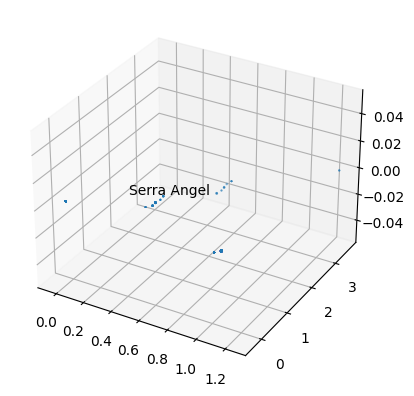

In [21]:
pca = PCA(n_components = 3).fit(Vectors_Colors)

print(Vectors_Colors)

#components = pca.fit(Vectors_Colors)
X_pca = pca.transform(Vectors_Colors)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
list_X = []
list_Y = []
list_Z = []
for each in X_pca:
    list_X.append(each[0])
    list_Y.append(each[1])
    list_Z.append(each[2])
plt.scatter(list_X,list_Y,list_Z)
for i, label in enumerate(annotations):
    if(label in ['Serra Angel', 'Nicol Bolas, the Ravager // Nicol Bolas, the Arisen', 'Solemn Simulacrum', 'Azorius Guildmage']):
        plt.annotate(label,(list_X[i],list_Y[i]))
plt.show()

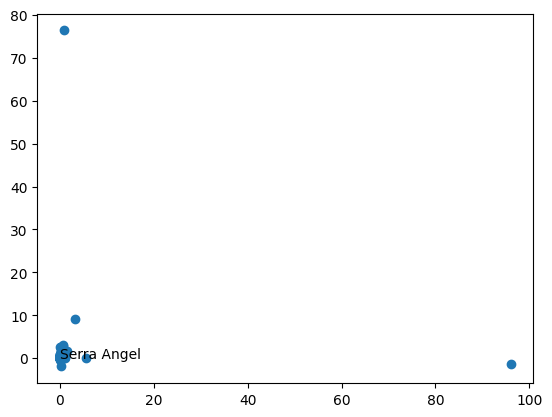

In [22]:
plt.clf()


pca = PCA(n_components = 2).fit(Vector_All)


#components = pca.fit(Vectors_Colors)
X_pca = pca.transform(Vector_All)
list_X = []
list_Y = []
for each in X_pca:
    list_X.append(each[0])
    list_Y.append(each[1])
plt.scatter(list_X,list_Y)
for i, label in enumerate(annotations):
    if(label in ['Serra Angel', 'Nicol Bolas, the Ravager // Nicol Bolas, the Arisen', 'Solemn Simulacrum', 'Azorius Guildmage','Counterspell','Liliana of the Veil','Urza\'s Saga']):
        plt.annotate(label,(list_X[i],list_Y[i]))
plt.show()
#components = pca.fit(Vectors_BiWords)

[[0. 1. 0. ... 1. 0. 0.]
 [0. 1. 0. ... 1. 0. 0.]
 [0. 1. 0. ... 1. 0. 0.]
 ...
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]]


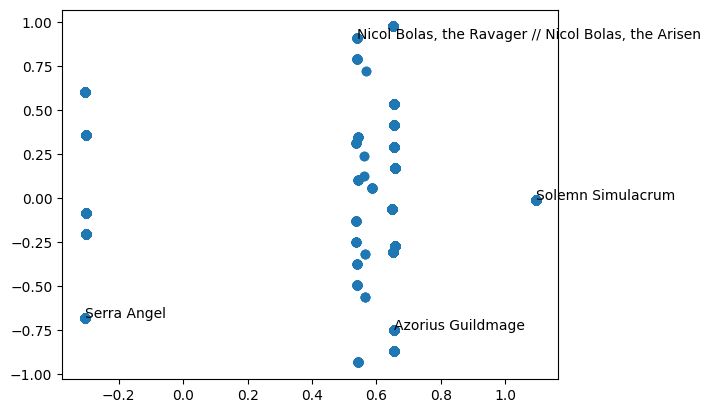

In [11]:
plt.clf()


pca = PCA(n_components = 2).fit(Vectors_Colors)

print(Vectors_Colors)

#components = pca.fit(Vectors_Colors)
X_pca = pca.transform(Vectors_Colors)
list_X = []
list_Y = []
for each in X_pca:
    list_X.append(each[0])
    list_Y.append(each[1])
plt.scatter(list_X,list_Y)
for i, label in enumerate(annotations):
    if(label in ['Serra Angel', 'Nicol Bolas, the Ravager // Nicol Bolas, the Arisen', 'Solemn Simulacrum', 'Azorius Guildmage']):
        plt.annotate(label,(list_X[i],list_Y[i]))
plt.show()
#components = pca.fit(Vectors_BiWords)


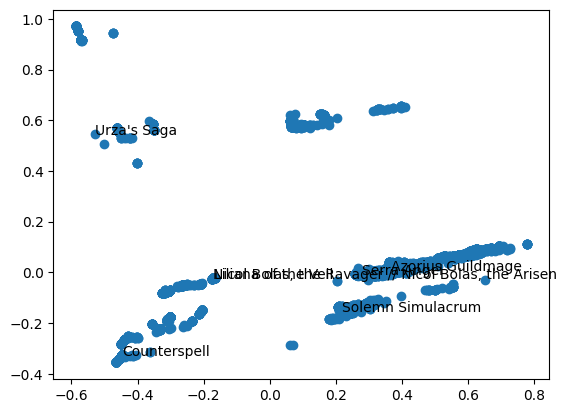

In [12]:
plt.clf()


pca = PCA(n_components = 2).fit(Vectors_Types)


#components = pca.fit(Vectors_Colors)
X_pca = pca.transform(Vectors_Types)
list_X = []
list_Y = []
for each in X_pca:
    list_X.append(each[0])
    list_Y.append(each[1])
plt.scatter(list_X,list_Y)
for i, label in enumerate(annotations):
    if(label in ['Serra Angel', 'Nicol Bolas, the Ravager // Nicol Bolas, the Arisen', 'Solemn Simulacrum', 'Azorius Guildmage','Counterspell','Liliana of the Veil','Urza\'s Saga']):
        plt.annotate(label,(list_X[i],list_Y[i]))
plt.show()
#components = pca.fit(Vectors_BiWords)

In [13]:
from lib2to3.pytree import Node


# Card_name = input("Enter card_name:")

# closest = 1
# saved = []
# len_to_save = 5
# # VTC = key_card_name[Card_name][4]
# # check = False
#  G = nx.Graph()
#  G.add_node(Card_name)
# for count,name in enumerate(key_card_name):
#     if(name!= Card_name):
#         value = spatial.distance.cosine(VTC,key_card_name[name][4])
#         if(len(saved)<len_to_save):
#             saved.append([name,value])
#         elif(check==False):
#             saved.sort(key=lambda x:x[1], reverse = True)
#             check = True
#         if(len(saved)>=len_to_save):
#             count2 = 0
#             check2 = False
#             while(value<saved[count2][1]):
#                 count2 += 1
#                 check2 = True
#                 if(count2 == len_to_save):
#                     break
#             if(check2):
#                 saved.insert(count2,[name,value])
#                 saved.pop(0)
                
# list_cards_used = [Card_name] 
                
# for each in saved:
#     G.add_node(each[0])
#     G.add_edge(Card_name,each[0])
#     list_cards_used.append(each[0])

   
# def find_edges(use_list):
#     list = use_list
#     check = False
#     for each in list:
#         each.append([])
#         each.append(check)
#         each.append(check)
#         each.append(key_card_name[each[0]][4])
#         print(each[5])
#     for count,name in enumerate(key_card_name):
#         for each in list:
#             if(name != each[0]):
#                 value = spatial.distance.cosine(each[5],key_card_name[name][4])
#                 if(len(each[2])<len_to_save):
#                     each[2].append([name,value])
#                 elif(each[3]==False):
#                     each[2].sort(key=lambda x:x[1], reverse = True)
#                     each[3] = True
#                 if(len(each[2])>=len_to_save):
#                     count2 = 0
#                     each[4] = False
#                     while(value<each[2][count2][1]):
#                         count2 += 1
#                         each[4] = True
#                         if(count2 == len_to_save):
#                             break
#                     if(each[4]):
#                         each[2].insert(count2,[name,value])
#                         each[2].pop(0)
#     return(use_list,list)

#def write_edges(use_list):
#   for each in use_list:
        
def find_edges_2(example_card_name):
    closest = 1
    saved = []
    len_to_save = 5
    VTC = key_card_name[example_card_name][4]
    check = False
    for count,name in enumerate(key_card_name):
        if(name != example_card_name):
            value = spatial.distance.cosine(VTC,key_card_name[name][4])
            if(len(saved)<len_to_save):
                saved.append([name,value])
            elif(check==False):
                saved.sort(key=lambda x:x[1], reverse = True)
                check = True
            if(len(saved)>=len_to_save):
                count2 = 0
                check2 = False
                while(value<saved[count2][1]):
                    count2 += 1
                    check2 = True
                    if(count2 == len_to_save):
                        break
                if(check2):
                    saved.insert(count2,[name,value])
                    saved.pop(0)
    return(saved)
    

true_check = False

def write_edges(example_card_name,use_list,graph):
    list_search_through = []
    for each in use_list:
            if(not graph.has_node(each[0])):
                graph.add_node(each[0])
                list_search_through.append(each[0])
            if(not graph.has_edge(example_card_name,each[0])):
                graph.add_edge(example_card_name,each[0], weight = 1-each[1])
        #for each in list:
    return list_search_through



In [14]:

Card_name = input("Enter card_name:")

list_cards = [Card_name]

G = nx.Graph()
G.add_node(Card_name)

find_edges_2(Card_name)
print(find_edges_2(Card_name))

First_list = write_edges(Card_name,find_edges_2(Card_name),G)


plt.clf
nx.draw(G, with_labels = True)

plt.show()
        

KeyError: ''

In [ ]:
def recursive_edge_writer(list_next_to_check,amount):
    if(list_next_to_check and amount>0):
        for each in list_next_to_check:
            Next_list = write_edges(each,find_edges_2(each),G)
            recursive_edge_writer(Next_list,amount-1)
    else:
        pass


           
    

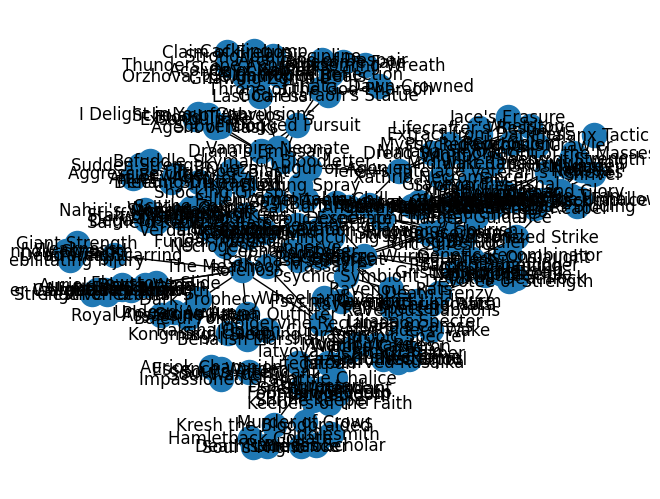

In [ ]:
plt.clf

how_deep = 5

recursive_edge_writer(First_list,how_deep)

nx.draw(G, with_labels = True)

plt.show()

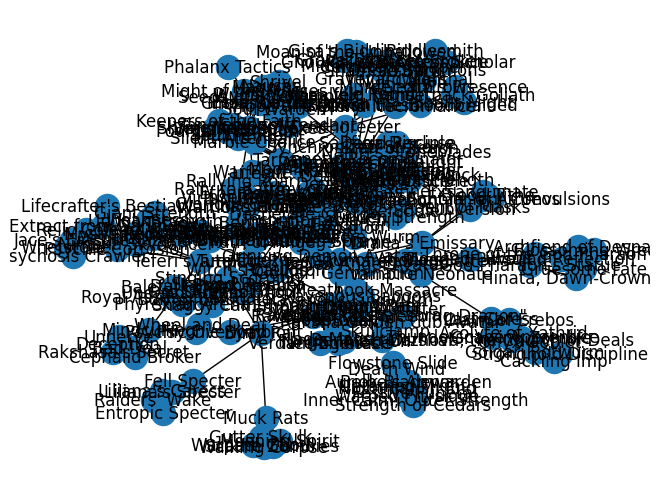

In [ ]:
nx.draw(G, with_labels = True)

plt.show()

In [ ]:
for count,each in enumerate(key_card_name['Barbed-Back Wurm'][4]):
    if(each!= 0.0):
        print(count)
        print(each)
        
for count,each in enumerate(key_card_name['Trench Wurm'][4]):
    if(each!= 0.0):
        print(count)
        print(each)

1
1.0921389
3
1.1162667
5
2.2868876
13
2.4941072
27
1.3205136
48
1.3938096
131
1.5062184
599
1.822939
1261
2.1220987
8050
4.2560477
13299
5.810409
30111
13.491352
122455
1.4064542
122508
1.6011071
122708
2.1727116
123791
4.0613017
133872
1.0
133875
1.0
133878
0.65282553
133941
1.4005983
60
1.4015957
282
1.6443702
391
1.7155433
1894
2.3443294
2661
2.5707963
3546
2.8063982
4811
3.1759846
5360
3.3006666
6075
3.5434973
122434
1.3545531
122766
2.312979
133872
1.0
133875
1.0
133878
0.65282553
133941
1.4005983
